
## Overview


### 1. Some config insights and optimization.

In [0]:
from pyspark.sql import SparkSession

spark = SparkSession \
    .builder \
    .appName("TaxiDriver Analytics") \
    .getOrCreate()

spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.3.2 
 Master 
 local[8] 
 AppName 
 Databricks Shell

In [0]:
# Check default parallelism
sc = spark.sparkContext
sc.defaultParallelism

Out[4]: 8

In [0]:
#Check default number of shuffle partitions
spark.conf.get( "spark.sql.shuffle.partitions" )

Out[5]: '200'

In [0]:
# Here we 're working with a relatively small dataset (where the data can fit into memory across the executors), we wouldn't need too many partitions. In this case, we could lower the number of partitions to reduce overhead
spark.conf.set("spark.sql.shuffle.partitions", 4)

In [0]:
# Enable Adaptive Query Execution (AQE) in Spark to dynamically adjust shuffle partitions during execution
spark.conf.set("spark.sql.adaptive.enabled", "true")

In [0]:
from pyspark.sql.functions import spark_partition_id, count
# This function is getting the number of records per parition to trace and optimize.
def getDataFrameStats(dataFrame):
    outputDF = (
                    dataFrame

                        # Get partition number for each record
                        .withColumn("Partition Number", spark_partition_id())

                        # Group by partition, and calculate stats for a column
                        .groupBy("Partition Number")

                        .agg(
                                  count("*").alias("Record Count")
                            )
                        
                        .orderBy("Partition Number")
               )

    return outputDF

### 2. Read the data of the trips from csv file, make some data engineering then save the file as parquet file to be read in future as parquet.

In [0]:
from pyspark.sql.types import StructType, StructField, StringType, IntegerType, MapType, ArrayType, DoubleType, FloatType, TimestampType

# Define schema to avoid Spark's inference, as this would save inference time.
schema = StructType([
    StructField("medallion", StringType(), True),
    StructField("hack_license", StringType(), True),
    StructField("vendor_id", StringType(), True),
    StructField("rate_code", IntegerType(), True),
    StructField("store_and_fwd_flag", StringType(), True),
    StructField("pickup_datetime", TimestampType(), True),
    StructField("dropoff_datetime", TimestampType(), True),
    StructField("passenger_count", IntegerType(), True),
    StructField("trip_time_in_secs", IntegerType(), True),
    StructField("trip_distance", FloatType(), True),
    StructField("pickup_longitude", FloatType(), True),
    StructField("pickup_latitude", FloatType(), True),
    StructField("dropoff_longitude", FloatType(), True),
    StructField("dropoff_latitude", FloatType(), True)
])

# Read the CSV file with optimizations
csv_df = spark.read.csv(
    "/FileStore/tables/sample-1.csv",
    schema=schema,
    header=True,
    mode="DROPMALFORMED",   # Ignores corrupted rows for cleaner data
)

# # Show schema and sample data
csv_df.printSchema()
# csv_df.show(5)
display(csv_df)


root
 |-- medallion: string (nullable = true)
 |-- hack_license: string (nullable = true)
 |-- vendor_id: string (nullable = true)
 |-- rate_code: integer (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- pickup_datetime: timestamp (nullable = true)
 |-- dropoff_datetime: timestamp (nullable = true)
 |-- passenger_count: integer (nullable = true)
 |-- trip_time_in_secs: integer (nullable = true)
 |-- trip_distance: float (nullable = true)
 |-- pickup_longitude: float (nullable = true)
 |-- pickup_latitude: float (nullable = true)
 |-- dropoff_longitude: float (nullable = true)
 |-- dropoff_latitude: float (nullable = true)



medallion,hack_license,vendor_id,rate_code,store_and_fwd_flag,pickup_datetime,dropoff_datetime,passenger_count,trip_time_in_secs,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
89D227B655E5C82AECF13C3F540D4CF4,BA96DE419E711691B9445D6A6307C170,CMT,1,N,2013-01-01T15:11:48.000+0000,2013-01-01T15:18:10.000+0000,4,382,1.0,-73.978165,40.757977,-73.98984,40.75117
0BD7C8F5BA12B88E0B67BED28BEA73D8,9FD8F69F0804BDB5549F40E9DA1BE472,CMT,1,N,2013-01-06T00:18:35.000+0000,2013-01-06T00:22:54.000+0000,1,259,1.5,-74.00668,40.73178,-73.9945,40.75066
0BD7C8F5BA12B88E0B67BED28BEA73D8,9FD8F69F0804BDB5549F40E9DA1BE472,CMT,1,N,2013-01-05T18:49:41.000+0000,2013-01-05T18:54:23.000+0000,1,282,1.1,-74.00471,40.73777,-74.009834,40.726
DFD2202EE08F7A8DC9A57B02ACB81FE2,51EE87E3205C985EF8431D850C786310,CMT,1,N,2013-01-07T23:54:15.000+0000,2013-01-07T23:58:20.000+0000,2,244,0.7,-73.9746,40.759945,-73.98473,40.759388
DFD2202EE08F7A8DC9A57B02ACB81FE2,51EE87E3205C985EF8431D850C786310,CMT,1,N,2013-01-07T23:25:03.000+0000,2013-01-07T23:34:24.000+0000,1,560,2.1,-73.97625,40.748528,-74.00259,40.747868
20D9ECB2CA0767CF7A01564DF2844A3E,598CCE5B9C1918568DEE71F43CF26CD2,CMT,1,N,2013-01-07T15:27:48.000+0000,2013-01-07T15:38:37.000+0000,1,648,1.7,-73.96674,40.76425,-73.98332,40.743763
496644932DF3932605C22C7926FF0FE0,513189AD756FF14FE670D10B92FAF04C,CMT,1,N,2013-01-08T11:01:15.000+0000,2013-01-08T11:08:14.000+0000,1,418,0.8,-73.995804,40.743977,-74.007416,40.744343
0B57B9633A2FECD3D3B1944AFC7471CF,CCD4367B417ED6634D986F573A552A62,CMT,1,N,2013-01-07T12:39:18.000+0000,2013-01-07T13:10:56.000+0000,3,1898,10.7,-73.98994,40.756775,-73.86525,40.77063
2C0E91FF20A856C891483ED63589F982,1DA2F6543A62B8ED934771661A9D2FA0,CMT,1,N,2013-01-07T18:15:47.000+0000,2013-01-07T18:20:47.000+0000,1,299,0.8,-73.98007,40.743137,-73.98271,40.735336
2D4B95E2FA7B2E85118EC5CA4570FA58,CD2F522EEE1FF5F5A8D8B679E23576B3,CMT,1,N,2013-01-07T15:33:28.000+0000,2013-01-07T15:49:26.000+0000,2,957,2.5,-73.977936,40.786983,-73.95292,40.80637


Based on the tasks we’re performing, the following columns are necessary:

**pickup_datetime**: Used to calculate trip duration and idle time.

**dropoff_datetime:** Also used for trip duration and idle time.

**pickup_longitude and pickup_latitude**: Used to determine the pickup borough.

**dropoff_longitude and dropoff_latitude**: Used to determine the drop-off borough.

**medallion**: Identifier for each taxi, required for calculating utilization based on driver or taxi.

**hack_license**: Used to group trips by driver ID for calculating idle time and utilization.

In [0]:
# Drop columns that are not needed for the analysis
csv_df = csv_df.drop("vendor_id", "rate_code", "store_and_fwd_flag", "passenger_count", "trip_time_in_secs", "trip_distance")

csv_df.printSchema()

root
 |-- medallion: string (nullable = true)
 |-- hack_license: string (nullable = true)
 |-- pickup_datetime: timestamp (nullable = true)
 |-- dropoff_datetime: timestamp (nullable = true)
 |-- pickup_longitude: float (nullable = true)
 |-- pickup_latitude: float (nullable = true)
 |-- dropoff_longitude: float (nullable = true)
 |-- dropoff_latitude: float (nullable = true)



In [0]:
# Let's check the distibution of the records after repartitioning.
display(getDataFrameStats(csv_df))

Partition Number,Record Count
0,25286
1,25267
2,25259
3,24187


In [0]:
print("Number of Partitions: ",csv_df.rdd.getNumPartitions())


Number of Partitions:  4


In [0]:
spark.conf.set("spark.sql.files.minPartitionNum", 8)

In [0]:
csv_df = csv_df.repartition(8)

In [0]:
spark.conf.get( "spark.sql.shuffle.partitions" )

Out[15]: '8'

In [0]:
# Check number of records
print("Number of taxi data csv records:",csv_df.count())

Number of taxi data csv records: 99999


#### Convert the csv data to Parquet data to be saved and read as parquest file in the future as Parquet files have some benefits over CSV file:
1. **Faster Reads/Writes**: Parquet is optimized for read-heavy workloads due to its columnar structure.
2. **Reduced Storage**: Binary formats with compression significantly reduce file size compared to raw CSV.
3. **Type Safety**: Ensures strict adherence to schema during reads.
4. **Partitioning**: Parquet supports partitioning, which helps in reducing the scope of queries and speeds up performance.\

Note:
Before saving it to parquet file, we would order the dataframe to be ordered and skip ordering in future use.

In [0]:
# Order the DataFrame by pickup_datetime
ordered_df = csv_df.orderBy("pickup_datetime")

# Save as Parquet for optimized storage and faster querying
ordered_df.write.parquet("/dbfs/mnt/data/optimized_data.parquet", mode="overwrite")

In [0]:
# To read from Parquet
parquet_df = spark.read.parquet("/dbfs/mnt/data/optimized_data.parquet")

# Show schema and sample data
parquet_df.printSchema()
display(parquet_df)


root
 |-- medallion: string (nullable = true)
 |-- hack_license: string (nullable = true)
 |-- pickup_datetime: timestamp (nullable = true)
 |-- dropoff_datetime: timestamp (nullable = true)
 |-- pickup_longitude: float (nullable = true)
 |-- pickup_latitude: float (nullable = true)
 |-- dropoff_longitude: float (nullable = true)
 |-- dropoff_latitude: float (nullable = true)



medallion,hack_license,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
3E841B83C3B99F71F38C483C76D39E4F,21D086F9F8A40D99A834C253B05DD6D4,2013-01-01T00:20:00.000+0000,2013-01-01T00:20:00.000+0000,0.0,0.0,0.0,0.0
63E1CE031EDB33209F200A44A2A50532,DCD6A3DA3488EF99AAC46FE0EF41449B,2013-01-01T00:21:00.000+0000,2013-01-01T00:21:00.000+0000,0.0,0.0,0.0,0.0
B3948FE1C9BAA60429084C3C8C742439,C63F0F41FE26715299FCFE119C066D37,2013-01-01T01:04:00.000+0000,2013-01-01T01:24:00.000+0000,-73.98015,40.742676,-73.98437,40.770008
6FC85A1A4C9E9824D0D1A10532166A81,F83A6C49D423DA3266BB1268FCE4E568,2013-01-01T02:17:00.000+0000,2013-01-01T02:25:00.000+0000,0.0,0.0,0.0,0.0
A4142B3536A686E0AF19544F86E1FE08,B063A1EAECC781EA74195C6F27F43C20,2013-01-01T02:28:00.000+0000,2013-01-01T02:38:00.000+0000,0.0,0.0,0.0,0.0
1E170F1AC4227B6A930CE041C54FAC55,3178E9041332A4F037E6FDE5C2CB92FA,2013-01-01T03:02:00.000+0000,2013-01-01T03:05:00.000+0000,-73.99825,40.754307,-73.99632,40.758247
9E28C3598E3575951F8AD16241E5B874,7568B4EB4A5D30A41F53ED359BF81B7A,2013-01-01T04:00:00.000+0000,2013-01-01T04:18:00.000+0000,-73.96067,40.79733,-73.92416,40.760742
72427BE07CFC31814826BCE9EB92D8D5,BC06BC4CB757E3F09B1F65C055ADC51B,2013-01-01T06:24:00.000+0000,2013-01-01T06:29:00.000+0000,0.0,0.0,0.0,0.0
2242A513238185D3AD7704A75EF21FB8,B9D6CB5BB1ECE2FC4010272137D2A336,2013-01-01T07:14:00.000+0000,2013-01-01T07:25:00.000+0000,0.0,0.0,0.0,0.0
333D72A3E9C09AD9EFBF79F549EFA67B,ED57BB723A58FFF10DCA8AC08AC1B103,2013-01-01T09:19:27.000+0000,2013-01-01T09:21:52.000+0000,-73.954796,40.59893,-73.95053,40.604225


> ### 3. Now let's read the geojson data with coordinates for each borough.

In [0]:
from pyspark.sql.types import StructType, StructField, ArrayType, StringType, LongType, DoubleType

# Define the schema for GeoJSON as this would save time inferring the schema.
schema = StructType([
    StructField("features", ArrayType(
        StructType([
            StructField("geometry", StructType([
                StructField("coordinates", ArrayType(
                    ArrayType(ArrayType(DoubleType(), containsNull=True), containsNull=True),
                    containsNull=True
                )),
                StructField("type", StringType(), nullable=True)
            ]), nullable=True),
            StructField("id", LongType(), nullable=True),
            StructField("properties", StructType([
                StructField("@id", StringType(), nullable=True),
                StructField("borough", StringType(), nullable=True),
                StructField("boroughCode", LongType(), nullable=True)
            ]), nullable=True),
            StructField("type", StringType(), nullable=True)
        ])
    ), nullable=True),
    StructField("type", StringType(), nullable=True)
])

# Load GeoJSON file as a JSON DataFrame
geojson_df = spark.read \
    .format("json") \
    .option("multiline", "true") \
    .schema(schema) \
    .load("/FileStore/tables/nyc_boroughs.geojson")

# Show the schema to understand the structure
geojson_df.printSchema()
# geojson_df.show(truncate=False)
display(geojson_df)

root
 |-- features: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- geometry: struct (nullable = true)
 |    |    |    |-- coordinates: array (nullable = true)
 |    |    |    |    |-- element: array (containsNull = true)
 |    |    |    |    |    |-- element: array (containsNull = true)
 |    |    |    |    |    |    |-- element: double (containsNull = true)
 |    |    |    |-- type: string (nullable = true)
 |    |    |-- id: long (nullable = true)
 |    |    |-- properties: struct (nullable = true)
 |    |    |    |-- @id: string (nullable = true)
 |    |    |    |-- borough: string (nullable = true)
 |    |    |    |-- boroughCode: long (nullable = true)
 |    |    |-- type: string (nullable = true)
 |-- type: string (nullable = true)



features,type


In [0]:
from pyspark.sql import functions as F
from pyspark.sql.types import StructType, StructField, ArrayType, StringType, LongType, DoubleType

# Define the schema for GeoJSON
schema = StructType([
    StructField("features", ArrayType(
        StructType([
            StructField("geometry", StructType([
                StructField("coordinates", ArrayType(
                    ArrayType(ArrayType(DoubleType(), containsNull=True), containsNull=True),
                    containsNull=True
                )),
                StructField("type", StringType(), nullable=True)
            ]), nullable=True),
            StructField("id", LongType(), nullable=True),
            StructField("properties", StructType([
                StructField("@id", StringType(), nullable=True),
                StructField("borough", StringType(), nullable=True),
                StructField("boroughCode", LongType(), nullable=True)
            ]), nullable=True),
            StructField("type", StringType(), nullable=True)
        ])
    ), nullable=True),
    StructField("type", StringType(), nullable=True)
])

# Read the GeoJSON file with the schema
geojson_df = spark.read \
    .format("json") \
    .option("multiline", "true") \
    .schema(schema) \
    .load("/FileStore/tables/nyc_boroughs.geojson")

# Exploding the 'features' array to work with individual features
geojson_df_exploded = geojson_df.withColumn("feature", F.explode("features")).select("feature.*")

# Show the exploded DataFrame
# geojson_df_exploded.show(truncate=False)
geojson_df.printSchema()

# geojson_df.show(truncate=False)
display(geojson_df_exploded)


root
 |-- features: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- geometry: struct (nullable = true)
 |    |    |    |-- coordinates: array (nullable = true)
 |    |    |    |    |-- element: array (containsNull = true)
 |    |    |    |    |    |-- element: array (containsNull = true)
 |    |    |    |    |    |    |-- element: double (containsNull = true)
 |    |    |    |-- type: string (nullable = true)
 |    |    |-- id: long (nullable = true)
 |    |    |-- properties: struct (nullable = true)
 |    |    |    |-- @id: string (nullable = true)
 |    |    |    |-- borough: string (nullable = true)
 |    |    |    |-- boroughCode: long (nullable = true)
 |    |    |-- type: string (nullable = true)
 |-- type: string (nullable = true)



geometry id properties type List(List(List(List(-74.05050806403247, 40.566422034160816), List(-74.04998352562575, 40.56639592492827), List(-74.04931640362088, 40.56588774778044), List(-74.04923629842045, 40.5653627363681), List(-74.05002620158643, 40.565318180621134), List(-74.05090601705089, 40.5660943421306), List(-74.05067916748614, 40.5663108457364), List(-74.05107159803778, 40.5667224933978), List(-74.05050806403247, 40.566422034160816))), Polygon) 0 List(http://nyc.pediacities.com/Resource/Borough/Staten_Island, Staten Island, 5) Feature List(List(List(List(-74.05314036821109, 40.577702715545755), List(-74.05406044939875, 40.57711644523887), List(-74.05489778210804, 40.57778244091981), List(-74.05469316907487, 40.579691632229434), List(-74.05485134625391, 40.57970759307761), List(-74.05484560052174, 40.579945791427605), List(-74.05368629150419, 40.58054875961441), List(-74.05293190639817, 40.57990247466585), List(-74.05314036821109, 40.577702715545755))), Polygon) 1 List(http://nyc.pediacities.com/Resource/Borough/Staten_Island, Staten Island, 5) Feature List(List(List(List(-74.15945602438188, 40.641448333324036), List(-74.15997875699617, 40.64144648083637), List(-74.16111242522175, 40.641835453737215), List(-74.16146036005294, 40.644294969764864), List(-74.15798759540647, 40.64386178896607), List(-74.1574334920099, 40.643302857779005), List(-74.15791589406767, 40.64308269445278), List(-74.15813451603348, 40.642632530662986), List(-74.15855043770541, 40.642497501306394), List(-74.15881093745297, 40.64175863474031), List(-74.15945602438188, 40.641448333324036))), Polygon) 2 List(http://nyc.pediacities.com/Resource/Borough/Staten_Island, Staten Island, 5) Feature List(List(List(List(-74.08221272914938, 40.64828016229008), List(-74.08142228203805, 40.64850472594939), List(-74.08072838762374, 40.64827487384626), List(-74.07980996428705, 40.648383312987924), List(-74.07899546333259, 40.648142554422414), List(-74.0765065715286, 40.646968818183346), List(-74.074452825637, 40.645067488723235), List(-74.07395839976468, 40.645193205445516), List(-74.07359107919278, 40.64499892804299), List(-74.07349851367621, 40.6450833734751), List(-74.07385653684726, 40.645424816099606), List(-74.07333813856985, 40.64578311616224), List(-74.07324539464854, 40.64570492526951), List(-74.07369011806556, 40.64530572505997), List(-74.07323853810762, 40.644963863909815), List(-74.07302520507203, 40.64513123832014), List(-74.07320225954699, 40.64494394124351), List(-74.07305559881722, 40.644807917840915), List(-74.07342590747642, 40.64500056851519), List(-74.0731218418351, 40.644714799468936), List(-74.07279850341497, 40.64491012376874), List(-74.07258775553872, 40.64479086317363), List(-74.07270308267604, 40.644645595627516), List(-74.07256468232954, 40.64471974885815), List(-74.07266630771205, 40.644620920659506), List(-74.07253222025732, 40.64455679217023), List(-74.07272467145081, 40.64462088376608), List(-74.07269828799028, 40.644441273467336), List(-74.07165829759785, 40.64503374643502), List(-74.07230919046847, 40.644577754057316), List(-74.0720184321324, 40.64441193294084), List(-74.07229190281824, 40.64426604782041), List(-74.07218488601669, 40.64411046539512), List(-74.07186080870876, 40.64420176177014), List(-74.07175648087782, 40.644011845498596), List(-74.07205817506038, 40.64390042769861), List(-74.07164969408521, 40.643786885724616), List(-74.0715967920116, 40.64346015748862), List(-74.07135612176634, 40.64349730455603), List(-74.07148202432622, 40.64329262506351), List(-74.07093784471478, 40.64334596384056), List(-74.07144331706317, 40.643270561330596), List(-74.07113105720937, 40.64320526367828), List(-74.07150263147403, 40.64312930419288), List(-74.07147777322618, 40.64280829377497), List(-74.07164892198996, 40.64267993167963), List(-74.0717035196727, 40.64279633527997), List(-74.07218434969042, 40.64271409328908), List(-74.07210952444633, 40.64246321679275), List(-74.07037430990599, 40.64269140305315), List(-74.07032923715391, 40.642

In [0]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Polygon, MultiPolygon
import numpy as np

# Step 1: Collect the data from Spark DataFrame into a Pandas DataFrame
df = geojson_df_exploded.select("geometry", "id", "properties", "type").toPandas()

# Step 2: Define a function to convert numpy arrays to lists and create a Polygon or MultiPolygon
def create_geometry(coords):
    try:
        # Convert numpy arrays to lists for compatibility with shapely
        coords = [coord.tolist() if isinstance(coord, np.ndarray) else coord for coord in coords]
        
        # Check the nesting level to determine if it's a Polygon or MultiPolygon
        if isinstance(coords[0][0], (float, int)):
            # Single Polygon: just one set of coordinates
            return Polygon(coords)
        elif isinstance(coords[0][0][0], (float, int)):
            # Single Polygon within an outer array
            return Polygon(coords[0])
        elif isinstance(coords[0][0], list):
            # MultiPolygon: multiple polygons within an outer array
            return MultiPolygon([Polygon(poly) for poly in coords])
        else:
            return None
    except Exception as e:
        print(f"Error creating geometry: {e}")
        return None

# Step 3: Apply the function to create geometries
df['geometry'] = df['geometry'].apply(lambda row: create_geometry(row['coordinates']) if row and 'coordinates' in row else None)

# Step 4: Convert the Pandas DataFrame to a GeoPandas GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# Step 5: Set the coordinate reference system (CRS), assuming the coordinates are in EPSG:4326 (WGS 84)
gdf.set_crs("EPSG:4326", allow_override=True, inplace=True)

# Step 6: Convert to GeoJSON FeatureCollection
geojson = gdf.to_json()

# Print the GeoJSON FeatureCollection
print(geojson)


{"type": "FeatureCollection", "features": [{"id": "0", "type": "Feature", "properties": {"id": 0, "properties": {"@id": "http://nyc.pediacities.com/Resource/Borough/Staten_Island", "borough": "Staten Island", "boroughCode": 5}, "type": "Feature"}, "geometry": {"type": "Polygon", "coordinates": [[[-74.05050806403247, 40.566422034160816], [-74.04998352562575, 40.56639592492827], [-74.04931640362088, 40.56588774778044], [-74.04923629842045, 40.5653627363681], [-74.05002620158643, 40.565318180621134], [-74.05090601705089, 40.5660943421306], [-74.05067916748614, 40.5663108457364], [-74.05107159803778, 40.5667224933978], [-74.05050806403247, 40.566422034160816]]]}}, {"id": "1", "type": "Feature", "properties": {"id": 1, "properties": {"@id": "http://nyc.pediacities.com/Resource/Borough/Staten_Island", "borough": "Staten Island", "boroughCode": 5}, "type": "Feature"}, "geometry": {"type": "Polygon", "coordinates": [[[-74.05314036821109, 40.577702715545755], [-74.05406044939875, 40.57711644523

In [0]:
csv_df.select("dropoff_longitude", "dropoff_latitude").describe().show()

+-------+------------------+------------------+
|summary| dropoff_longitude|  dropoff_latitude|
+-------+------------------+------------------+
|  count|             99999|             99999|
|   mean|-72.55315789386614|39.922430156905925|
| stddev| 10.15435304702843| 14.80652294519622|
|    min|            -95.65|        -3113.7888|
|    max|               0.0|         652.72314|
+-------+------------------+------------------+



In [0]:
# Add new colulmn for the boroughs -> extracted from the properties column.
gdf['borough'] = gdf['properties'].apply(lambda x: x.get('borough') if isinstance(x, dict) else None)
print(gdf[['borough', 'geometry']].head())

         borough                                           geometry
0  Staten Island  POLYGON ((-74.05051 40.56642, -74.04998 40.566...
1  Staten Island  POLYGON ((-74.05314 40.5777, -74.05406 40.5771...
2  Staten Island  POLYGON ((-74.15946 40.64145, -74.15998 40.641...
3  Staten Island  POLYGON ((-74.08221 40.64828, -74.08142 40.648...
4         Queens  POLYGON ((-73.83668 40.59495, -73.83671 40.594...


Out[24]: <AxesSubplot:>

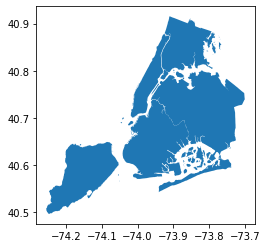

In [0]:
gdf.plot()

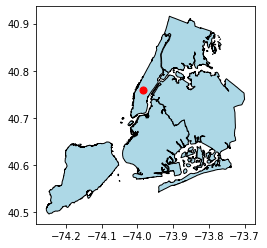

In [0]:
# A plot test point.
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd

# Create a GeoDataFrame for the test point
test_point = Point(-73.98483276367188, 40.75846862792969)
point_gdf = gpd.GeoDataFrame([{'geometry': test_point}], crs="EPSG:4326")

# Plot boroughs and test point
ax = gdf.plot(color='lightblue', edgecolor='black')
point_gdf.plot(ax=ax, color='red', markersize=50)
plt.show()


#### Now let's broadcast the geoJson data.
Broadcasting in Spark can be highly beneficial for optimizing operations when one of the datasets is small enough.

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.types import StringType
from shapely.geometry import Point, shape
import geopandas as gpd
from shapely.ops import unary_union

# Combine all polygons for each borough into a single geometry
boroughs_mapping = {
    borough: unary_union(gdf[gdf['borough'] == borough]['geometry'])
    for borough in gdf['borough'].unique()
}

# Broadcast the updated mapping
broadcast_boroughs = spark.sparkContext.broadcast(boroughs_mapping)

### 4. Mapping the drop off location with borough coordinates from the geoJson data

In [0]:
def map_coordinates_to_borough(long, lat):
    point = Point(long, lat)
    for borough, geom in broadcast_boroughs.value.items():
        if geom.contains(point) or geom.intersects(point):
            return borough
    return None

In [0]:
# Test the mapping function.
test_data = csv_df.select("dropoff_longitude", "dropoff_latitude").limit(10).collect()
for row in test_data:
    print(map_coordinates_to_borough(row["dropoff_longitude"], row["dropoff_latitude"]))


Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Brooklyn
Manhattan
Manhattan
Manhattan
Manhattan


In [0]:
print("Number of taxi data csv records:",csv_df.count())

Number of taxi data csv records: 99999


In [0]:
# Register the function as a UDF
map_to_borough_udf = F.udf(map_coordinates_to_borough, StringType())

csv_df = csv_df.withColumn(
    "destination_borough",
    map_to_borough_udf(csv_df.dropoff_longitude, csv_df.dropoff_latitude)
)

from pyspark.sql.window import Window

window_spec = Window.partitionBy("hack_license").orderBy("pickup_datetime")

csv_df = csv_df.withColumn(
    "idle_time",
    F.unix_timestamp("pickup_datetime") - F.unix_timestamp(F.lag("dropoff_datetime").over(window_spec))
)

In [0]:
from pyspark.sql import functions as F
# Remove idle times that exceed a reasonable threshold (e.g., 8 hours) or are negative.
csv_df = csv_df.filter((F.col("idle_time") > 0) & (F.col("idle_time") < (8*60*60)))  # 0 to 8 hours

In [0]:
print("Number of taxi data csv records after droping the outliers:",csv_df.count())

Number of taxi data csv records after droping the outliers: 87487


In [0]:
avg_idle_time = csv_df.groupBy("destination_borough") \
    .agg((F.avg("idle_time") / 60).alias("average_idle_time_minutes")) \
    .filter(F.col("destination_borough").isNotNull())

avg_idle_time.show()

+-------------------+-------------------------+
|destination_borough|average_idle_time_minutes|
+-------------------+-------------------------+
|           Brooklyn|       28.610712886799842|
|          Manhattan|       17.027459922609175|
|             Queens|        31.31870087840962|
|              Bronx|                     35.2|
|      Staten Island|                     13.0|
+-------------------+-------------------------+



### 5.now let's start getting the number of trips that started and ended within the same borough

In [0]:
# Repartition the data before processing to ensure it's well distributed.
csv_df = csv_df.repartition(8, "pickup_borough", "dropoff_borough")

In [0]:
# Add pickup and dropoff borough columns
csv_df = csv_df.withColumn(
    "pickup_borough",
    map_to_borough_udf(csv_df.pickup_longitude, csv_df.pickup_latitude)
).withColumn(
    "dropoff_borough",
    map_to_borough_udf(csv_df.dropoff_longitude, csv_df.dropoff_latitude)
)

In [0]:
# Filter trips where pickup and dropoff boroughs are the same
same_borough_trips = csv_df.filter(F.col("pickup_borough") == F.col("dropoff_borough"))

# Group by borough and count trips
same_borough_trip_count = same_borough_trips.groupBy("pickup_borough") \
    .count() \
    .withColumnRenamed("pickup_borough", "borough") \
    .withColumnRenamed("count", "trip_count")

# Show the result
same_borough_trip_count.show()

+---------+----------+
|  borough|trip_count|
+---------+----------+
| Brooklyn|       687|
|Manhattan|     75191|
|   Queens|       956|
|    Bronx|        41|
+---------+----------+



### 6. now let's start getting the number of trips that started in one borough and ended in another one. 

In [0]:
# Filter trips where pickup and dropoff boroughs are the same
different_borough_trips = csv_df.filter(F.col("pickup_borough") != F.col("dropoff_borough"))

# Group by borough and count trips
different_borough_trips_count = different_borough_trips.groupBy("pickup_borough") \
    .count() \
    .withColumnRenamed("pickup_borough", "pickup_borough") \
    .withColumnRenamed("dropoff_borough", "dropoff_borough") \
    .withColumnRenamed("count", "trip_count")

# Show the result
different_borough_trips_count.show()

+--------------+----------+
|pickup_borough|trip_count|
+--------------+----------+
|      Brooklyn|       544|
|     Manhattan|      4935|
|        Queens|      3077|
|         Bronx|        15|
| Staten Island|         1|
+--------------+----------+

